In [10]:
import ipdb
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
from utils import u_darrays as uda, constants as cnst
import datetime
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
from utils import u_darrays
import ipdb
from utils import constants as cnst, u_met
import salem
from utils import u_statistics as us
from salem import get_demo_file, DataLevels, GoogleVisibleMap, Map


%matplotlib inline

In [9]:
cd ..

/home/ck/pythonWorkspace


In [11]:
def calc_trend(data, month, hour=None, method=None, sig=False, wilks=False):

    y1 = 2000
    y2 = 2019

    if method is None:
        'Please provide trend calc method: polyfit or mk (mann kendall)'
    if hour is not None:

        if len(month)>1:

            data = data[((data['time.month'] >= month[0]) & (data['time.month'] <= month[1])) & (data['time.hour'] == hour) & (data['time.year'] >= y1) & (data['time.year'] <= y2)]
        else:

            data = data[(data['time.month'] == month[0]) & (data['time.hour'] == hour) & (data['time.year'] >= y1) & (data['time.year'] <= y2)]
    else:
        if len(month)>1:
            data = data[((data['time.month'] >= month[0]) & (data['time.month'] <= month[1]))& (data['time.year'] >= y1) & (data['time.year'] <= y2)]
        else:
            data = data[(data['time.month'] == month[0]) & (data['time.year'] >= y1) & (data['time.year'] <= y2)]

    if len(data.time)==0:
        print('Data does not seem to have picked month or hour. Please check input data')

    mean_years = data.groupby('time.year').mean('time')

    # stack lat and lon into a single dimension called allpoints
    datastacked = mean_years.stack(allpoints=['lat', 'lon'])


    # apply the function over allpoints to calculate the trend at each point
    print('Entering trend calc')

    alpha = 0.05
    # NaNs means there is not enough data, slope = 0 means there is no significant trend.
    if method=='mk':
        dtrend = datastacked.groupby('allpoints').apply(u_darrays.linear_trend_mk, alpha=alpha, eps=0.01,nb_valid=10)
        dtrend = dtrend.unstack('allpoints')
        if sig:
            (dtrend['slope'].values)[dtrend['ind'].values==0] = 0

    # NaNs means there is not enough data, slope = 0 means there is no significant trend.
    if method=='linregress':
        dtrend = datastacked.groupby('allpoints').apply(u_darrays.linear_trend_lingress,nb_valid=10)
        dtrend = dtrend.unstack('allpoints')

        if sig:
            (dtrend['slope'].values)[dtrend['pval'].values > alpha] = 0
            
    if method=='polyfit':
        dtrend = datastacked.groupby('allpoints').apply(u_darrays.linear_trend_polyfit,nb_valid=10)
        dtrend = dtrend.unstack('allpoints')

        if sig:
            (dtrend['slope'].values)[dtrend['pval'].values > alpha] = 0

    ddtrend = dtrend['slope']

#     if wilks and sig:
#         try:
#             pthresh = us.fdr_threshold(dtrend['pval'].values[np.isfinite(dtrend['pval'].values)], alpha=alpha)
#             ddtrend.values[(dtrend['pval'].values > pthresh) | np.isnan(dtrend['pval'].values)] = np.nan
#         except ValueError:
#             ddtrend.values = ddtrend.values * np.nan
#             pthresh = np.nan
#         print('p value threshold', pthresh)
    #ipdb.set_trace()
    # unstack back to lat lon coordinates
    
    ddout = uda.flip_lat(dtrend)
    
    return ddout, mean_years

In [12]:
mcs = '/home/ck/DIR/cornkle/data/HUARAZ/Lorenz_NDVI/RioSanta_NDVI_monthly.nc'
fpath = cnst.network_data + 'figs/HUARAZ/'
da3 = xr.open_dataarray(mcs)#/100

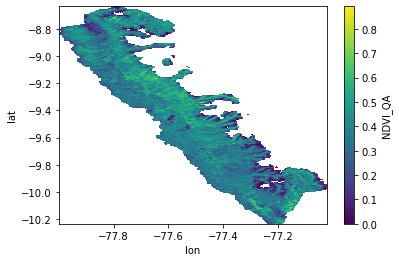

In [13]:
da3.mean('time').plot()

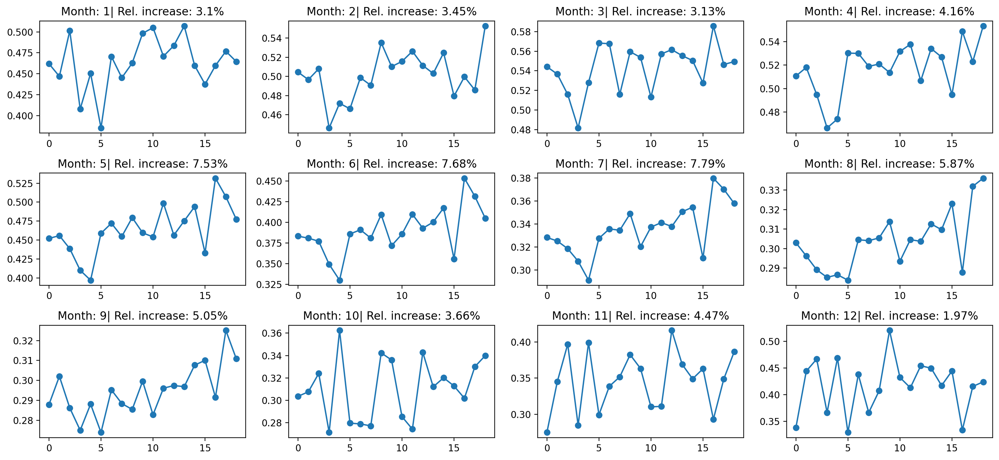

In [14]:
f = plt.figure(figsize=(15,7), dpi=200)
for ids, mm in enumerate([1,2,3,4,5,6,7,8,9,10,11,12]):

    ax = f.add_subplot(3,4,ids+1)
    sep = da3[da3['time.month']==mm].mean(['lat', 'lon'])
    slope, ints = np.polyfit(np.arange(len(sep)), sep, 1)
    plt.plot(sep, '-o')
    plt.title('Month: '+str(mm)+ '| Rel. increase: '+str(np.round(slope*10/np.mean(sep.values)*100,2))+'%')
plt.tight_layout()
f.savefig('/home/ck/DIR/cornkle/figs/HUARAZ/NDVI_trends/NDVI_mean_2000-2019.jpg')

In [7]:
def file_loop(inputs):
    
    fpath = '/home/ck/DIR/cornkle/data/HUARAZ/'
    
    m = inputs[0]
    da = inputs[1]
    
    if type(m)==int:
        m = [m]
    
    sig = False
    method='linregress'

    tirtrend, tirmean = calc_trend(da, m, method=method, sig=sig, wilks=False)
    tirm_mean = tirmean.mean('year')
    
    trend = tirtrend['slope']
    pval = tirtrend['pval']


    trend_da = xr.DataArray(trend, coords=[da['lat'], da['lon']], dims=['latitude','longitude'])
    trend_da.name = 'ndvi_trend'
    
    sig_da = xr.DataArray(pval, coords=[da['lat'], da['lon']], dims=['latitude','longitude'])
    sig_da.name = 'pval'
    
    mean_da = xr.DataArray(tirm_mean, coords=[da['lat'], da['lon']], dims=['latitude','longitude'])
    mean_da.name ='ndvi_mean'
    
    monthly = da.groupby('time.month').count('time')
    
    ds = xr.Dataset()
    ds['ndvi_trend'] = trend_da
    ds['ndvi_mean'] = mean_da
    ds['pval'] = sig_da
    ds['valid'] = monthly[monthly['month']==m[0]]

    
    ds.to_netcdf(fpath + 'NDVItrend_'+method+'_'+str(m).zfill(2)+'.nc')

In [8]:
# file_loop((3, da3))

Entering trend calc


KeyboardInterrupt: 

In [ ]:
fname = '/home/ck/DIR/cornkle/data/HUARAZ/'


m=[5,6,7,8] #[9,10,11,12,1,2,3,4]

inputs = []
for mm in m:
    inputs.append((mm,da3))

import multiprocessing


pool = multiprocessing.Pool(processes=4)

res = pool.map(file_loop, inputs)

pool.close()

In [ ]:
nosig_da

In [ ]:
da3

In [29]:
fname = '/home/ck/DIR/cornkle/data/HUARAZ/shapes/riosan_sel_one.shp'
sdf = salem.read_shapefile(fname)

In [15]:
flist = []
for mm in [1,2,3,4,5,6,7,8,9,10,11,12]:
    flist.append('/home/ck/DIR/cornkle/data/HUARAZ/NDVItrend_linregress_['+str(mm)+'].nc')

mfd = xr.open_mfdataset(flist, concat_dim='id', combine='nested')

In [16]:
ndvi_trend = mfd['ndvi_trend'].load()

In [17]:
ndvi_mean = mfd['ndvi_mean'].load()

In [18]:
mfd

<xarray.Dataset>
Dimensions:     (id: 12, lat: 769, latitude: 769, lon: 470, longitude: 470, month: 12)
Coordinates:
  * month       (month) int64 1 2 3 4 5 6 7 8 9 10 11 12
  * latitude    (latitude) float64 -8.634 -8.636 -8.639 ... -10.23 -10.23 -10.23
  * longitude   (longitude) float64 -78.0 -78.0 -77.99 ... -77.03 -77.02 -77.02
  * lat         (lat) float64 -8.634 -8.636 -8.639 ... -10.23 -10.23 -10.23
  * lon         (lon) float64 -78.0 -78.0 -77.99 -77.99 ... -77.03 -77.02 -77.02
Dimensions without coordinates: id
Data variables:
    ndvi_trend  (id, latitude, longitude) float64 nan nan nan ... nan nan nan
    ndvi_mean   (id, latitude, longitude) float32 nan nan nan ... nan nan nan
    pval        (id, latitude, longitude) float64 dask.array<chunksize=(1, 769, 470), meta=np.ndarray>
    valid       (id, month, lat, lon) float64 dask.array<chunksize=(1, 12, 769, 470), meta=np.ndarray>

In [19]:
means = ndvi_mean.squeeze()

<Figure size 26x18 with 0 Axes>

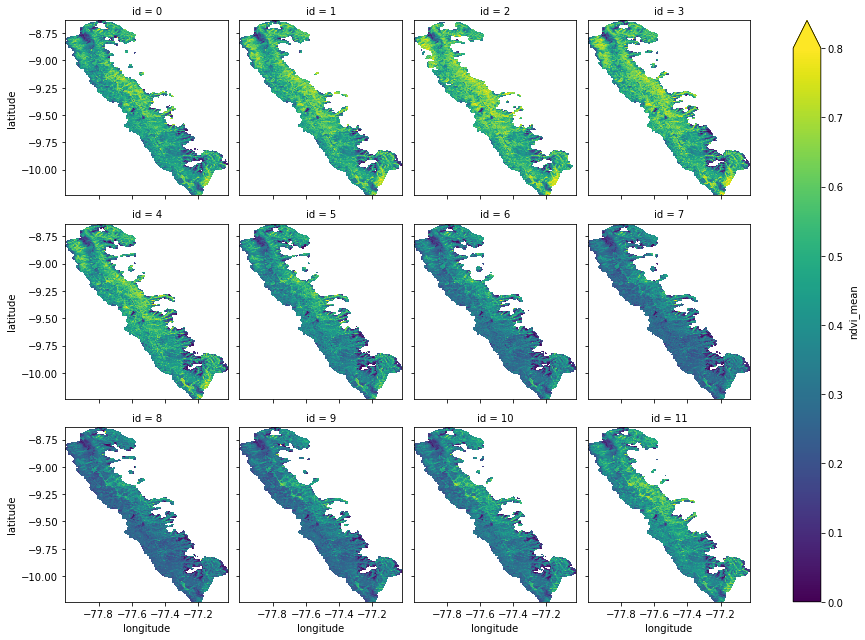

In [20]:
f = plt.figure(figsize=(13,9), dpi=2)
means.plot(x="longitude", y="latitude", col="id", col_wrap=4, vmax=0.8)

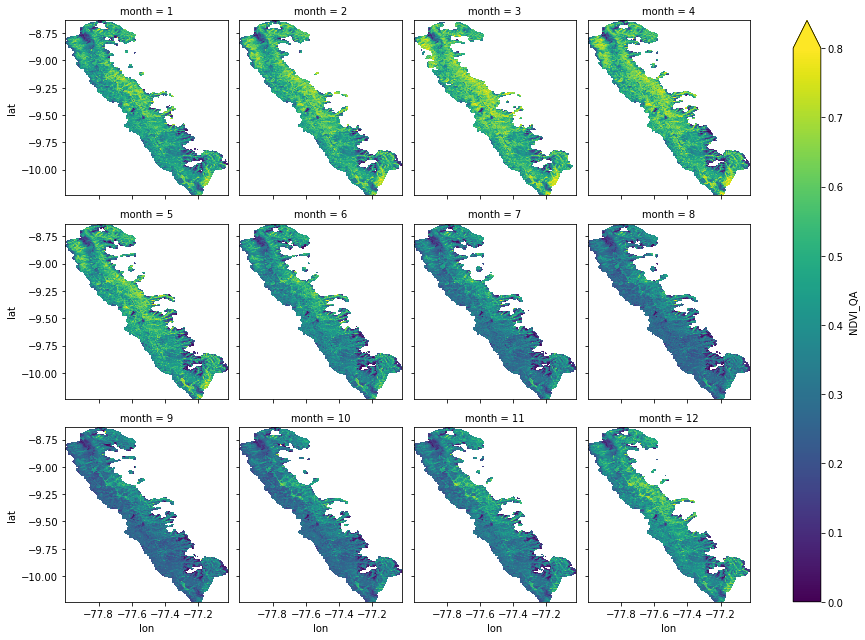

In [21]:
monthly = da3.groupby('time.month').mean('time')
monthly.plot(x="lon", y="lat", col="month", col_wrap=4, vmax=0.8)

In [22]:
valmask = np.isfinite(means[means['id']==7]).astype(int).squeeze()

In [23]:
np.sum(valmask)

<xarray.DataArray 'ndvi_mean' ()>
array(96579)

In [24]:
pval = mfd['pval'].load()

In [25]:
sig = ndvi_trend.copy()
sig.values[pval.values>0.05] = 0
#sig = sig.where(pval.values<=0.05)

In [26]:
np.sum(ndvi_trend.values[pval.values>0.05])

812.5922471379881

In [27]:
np.sum(sig.values[pval.values>0.05])

0.0

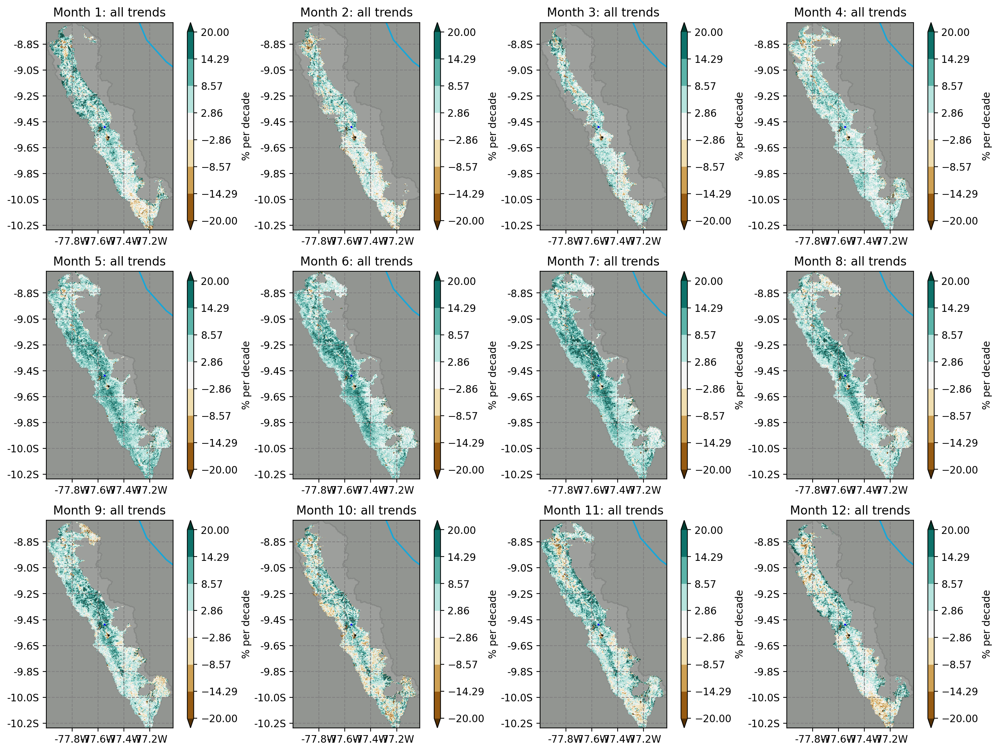

In [30]:
m=1
smap = ndvi_trend.salem.get_map()
f = plt.figure(figsize=(17,13), dpi=200)

smap.set_shapefile(sdf,facecolor='white', color='k', linewidth=1., alpha=0.1)
smap.set_plot_params(levels=np.linspace(-20, 20, 8), cmap='BrBG')
smap.set_shapefile(rivers=True)
smap.set_shapefile(lakes=True, facecolor='blue', edgecolor='blue')

x, y = smap.grid.transform(-77.52, -9.52)
xx, yy = smap.grid.transform(-77.55, -9.438)

cnt = 0
for m, pl in zip([1,2,3,4,5,6,7,8,9,10,11,12], ndvi_trend):
    
    mmean = ndvi_mean.isel(id=cnt)

    ax = f.add_subplot(3,4,cnt+1)
    ax.set_facecolor('xkcd:grey')
    
    plt.plot(x, y, 'ko', markersize=1)
    plt.plot(xx, yy, 'bo', markersize=1)


    smap.set_data(np.round(pl*10,2)/mmean*100)
    smap.visualize(ax=ax,addcbar=True, title='Month '+str(m)+ ': all trends', cbar_title='% per decade')
    cnt += 1
    
plt.tight_layout
f.savefig('/home/ck/DIR/cornkle/figs/HUARAZ/NDVI_trends/NDVI_linregress_trend_2000-2019_rel.jpg')

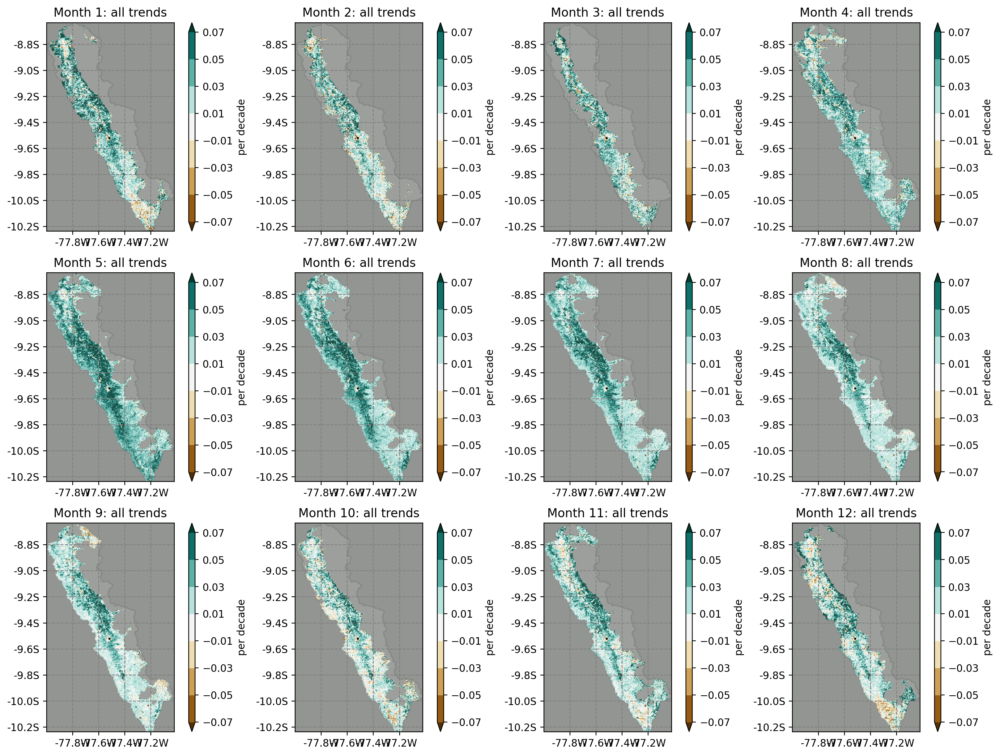

In [31]:
m=1
smap = ndvi_trend.salem.get_map()
f = plt.figure(figsize=(17,13), dpi=200)

smap.set_shapefile(sdf,facecolor='white', color='k', linewidth=1., alpha=0.1)
smap.set_plot_params(levels=np.linspace(-0.07, 0.07, 8), cmap='BrBG')
cnt = 0
for m, pl in zip([1,2,3,4,5,6,7,8,9,10,11,12], ndvi_trend):
    

    ax = f.add_subplot(3,4,cnt+1)
    ax.set_facecolor('xkcd:grey')
    
    plt.plot(x, y, 'ko', markersize=1)

    smap.set_data(np.round(pl*10,2))
    smap.visualize(ax=ax,addcbar=True, title='Month '+str(m)+ ': all trends', cbar_title='per decade')
    cnt += 1
f.savefig('/home/ck/DIR/cornkle/figs/HUARAZ/NDVI_trends/NDVI_linregress_trend_2000-2019.jpg')

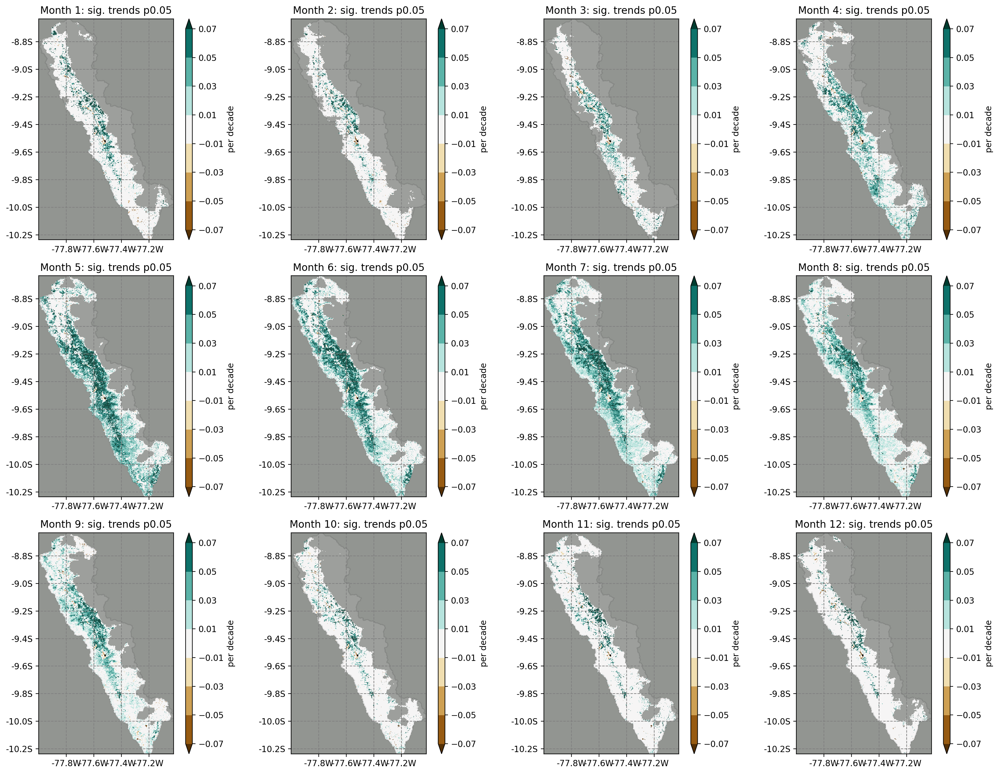

In [32]:
m=1
smap = sig.salem.get_map()
f = plt.figure(figsize=(17,13), dpi=200)

smap.set_shapefile(sdf,facecolor='white', color='k', linewidth=1., alpha=0.1)
smap.set_plot_params(levels=np.linspace(-0.07, 0.07, 8), cmap='BrBG')
cnt = 1
for m, pl in zip([1,2,3,4,5,6,7,8,9,10,11,12], sig):

    ax = f.add_subplot(3,4,cnt)
    ax.set_facecolor('xkcd:grey')
    
    plt.plot(x, y, 'ko', markersize=1)

    smap.set_data(pl*10)
    smap.visualize(ax=ax,addcbar=True, title='Month '+str(m)+ ': sig. trends p0.05', cbar_title='per decade')
    cnt += 1
    
plt.tight_layout()
f.savefig('/home/ck/DIR/cornkle/figs/HUARAZ/NDVI_trends/NDVI_linregress_sigtrend_2000-2019.jpg')

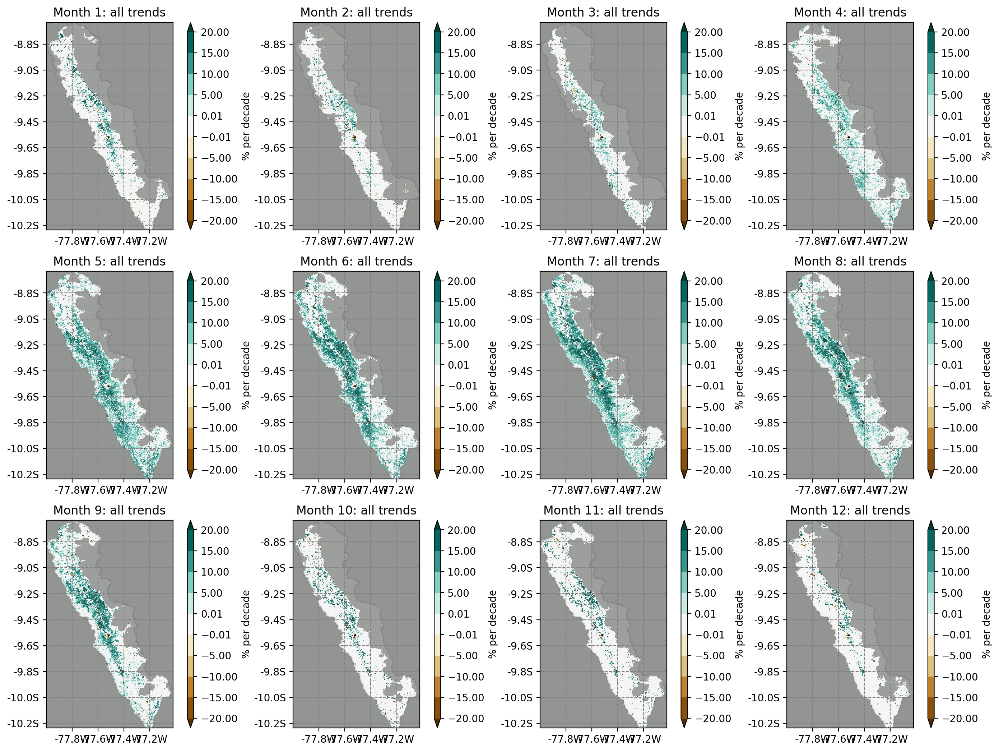

In [33]:
m=1
smap = sig.salem.get_map()
f = plt.figure(figsize=(17,13), dpi=200)

smap.set_shapefile(sdf,facecolor='white', color='k', linewidth=1., alpha=0.1)
smap.set_plot_params(levels=[-20,-15,-10,-5,-0.01,0.01,5,10,15,20], cmap='BrBG')
cnt = 0
for m, pl in zip([1,2,3,4,5,6,7,8,9,10,11,12], sig):
    
    mmean = ndvi_mean.isel(id=cnt)

    ax = f.add_subplot(3,4,cnt+1)
    ax.set_facecolor('xkcd:grey')
    
    plt.plot(x, y, 'ko', markersize=1)

    smap.set_data(np.round(pl*10,2)/mmean*100)
    smap.visualize(ax=ax,addcbar=True, title='Month '+str(m)+ ': all trends', cbar_title='% per decade')
    cnt += 1
f.savefig('/home/ck/DIR/cornkle/figs/HUARAZ/NDVI_trends/NDVI_linregress_sigtrend_2000-2019_rel.jpg')

In [ ]:
(sig.sel(id=4).mean(['latitude', 'longitude'])*10)/ndvi_mean.isel(id=4).mean(['latitude', 'longitude'])*100

In [67]:
sig

<xarray.DataArray 'ndvi_trend' (id: 8, latitude: 769, longitude: 470)>
array([[[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
...
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]]])
Coordinates:
  * latitude   (latitude) float64 -8.634 -8.636 -8.639 ... -10.23 -10.23 -10.23
  * longitude  (longitude) float64 -78.0 -78.0 -77.99 ... -77.03 -77.02 -77.02
Dimensions without coordinates: id

<Figure size 26x18 with 0 Axes>

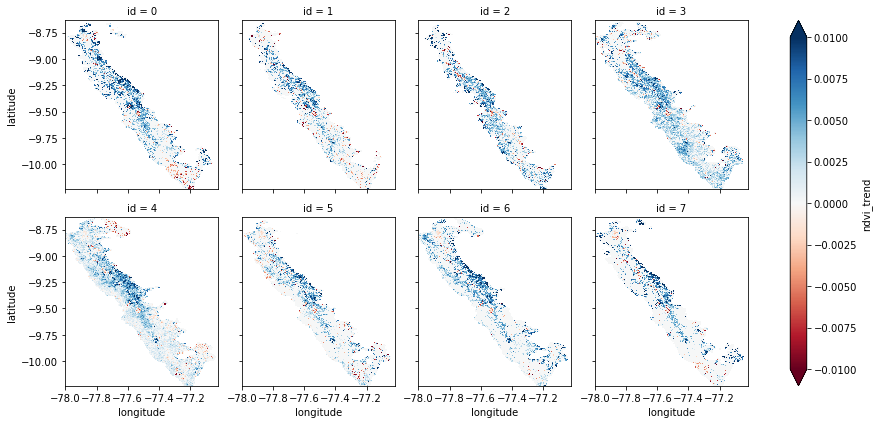

In [70]:
f = plt.figure(figsize=(13,9), dpi=2)
sig.plot(x="longitude", y="latitude", col="id", col_wrap=4, vmin=-0.01, vmax=0.01, cmap='RdBu')

{'imshow': <matplotlib.image.AxesImage at 0x7f932984c6d0>,
 'contour': [],
 'contourf': []}

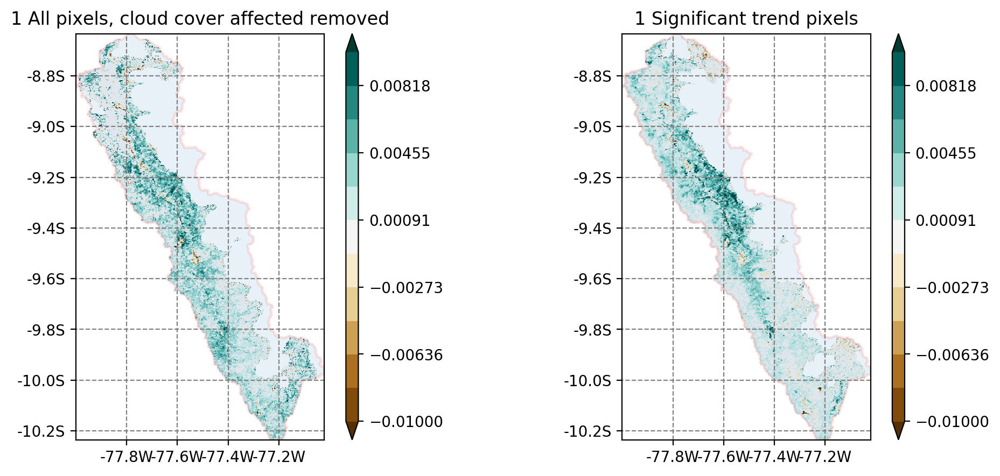

In [75]:
m=1
smap = da3.salem.get_map()
f = plt.figure(figsize=(12,5), dpi=200)
ax = f.add_subplot(121)
smap.set_shapefile(sdf,facecolor=None, color='red', linewidth=1.5, alpha=0.1)
#smap.set_plot_params(cmap='RdBu', extend='both', levels=np.arange(-0.015, 0.015, 10))
smap.set_data(sig[3])
smap.set_plot_params(levels=np.linspace(-0.01, 0.01, 12), cmap='BrBG')
smap.visualize(ax=ax,addcbar=True, title=str(m)+ ' All pixels, cloud cover affected removed')

ax1 = f.add_subplot(122)
smap.set_data(sig[4])
smap.visualize(ax=ax1,addcbar=True, title=str(m)+ ' Significant trend pixels')

In [77]:
monthly = da3.groupby('time.month').mean('time')
monthly.plot(x="lon", y="lat", col="month", col_wrap=4)

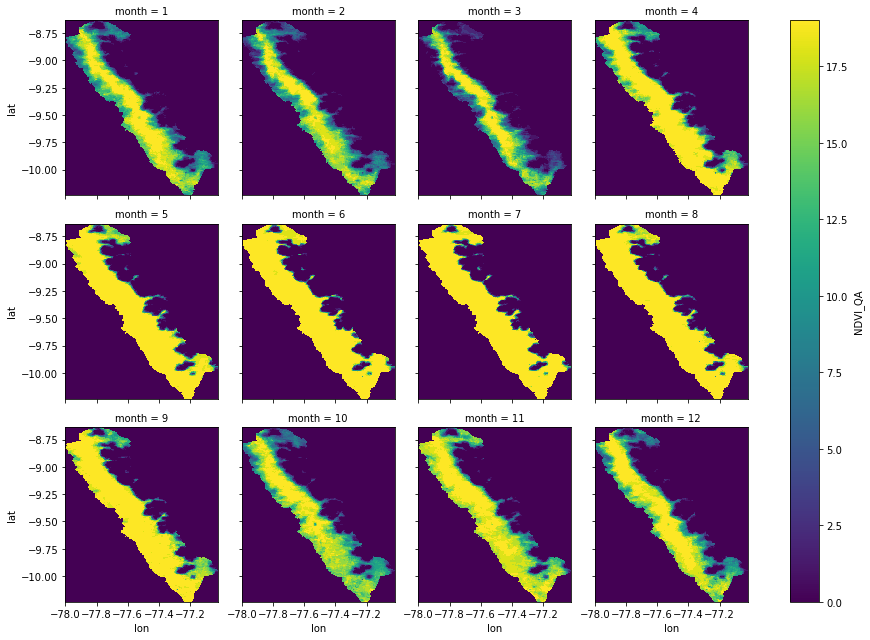

In [80]:
monthly = da3.groupby('time.month').count('time')
monthly.plot(x="lon", y="lat", col="month", col_wrap=4)

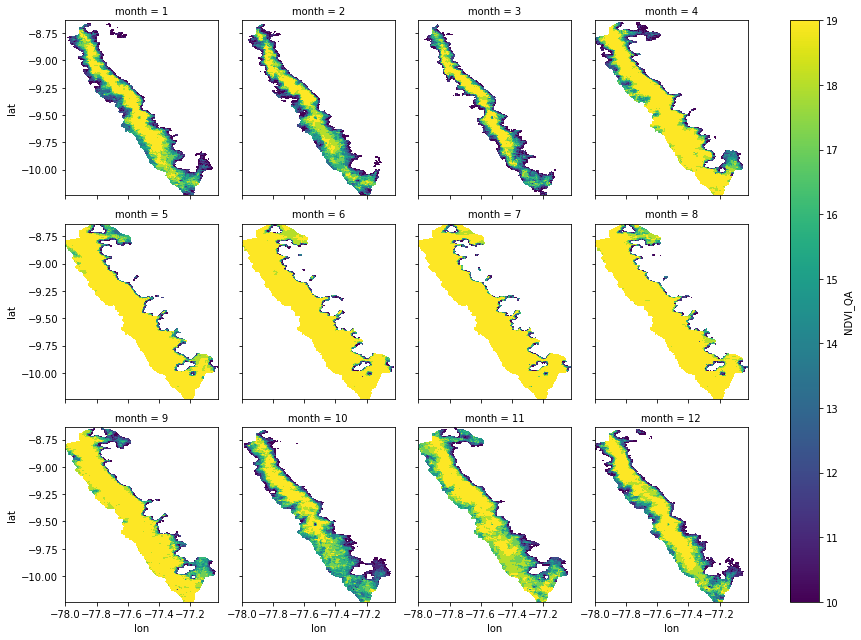

In [82]:
monthly = da3.groupby('time.month').count('time')
monthly.values = np.array(monthly.values, dtype=float)
monthly.values[monthly.values<10] = np.nan
monthly.plot(x="lon", y="lat", col="month", col_wrap=4)

In [323]:
box= [-9.3,-9.6,-77.7,-77.4] # [-9.3,-9.6,-77.7,-77.4] #[-9.25,-9.55,-77.75,-77.45] #  # [-9.3,-9.6,-77.7,-77.4]
g = GoogleVisibleMap(x=[box[3], box[2]], y=[box[1], box[0]],
                     scale=5,  # scale is for more details
                     maptype='satellite')  # try out also: 'terrain'

In [324]:
g

In [325]:
pick = sig.sel(longitude=slice(box[2],box[3]), latitude=slice(box[0],box[1]))

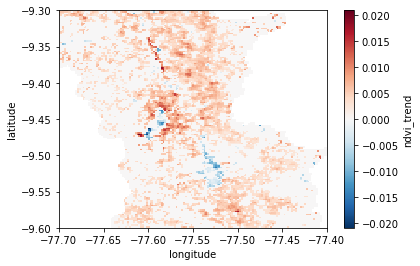

In [326]:
pick.isel(id=3).plot()

In [327]:
pick

<xarray.DataArray 'ndvi_trend' (id: 8, latitude: 144, longitude: 144)>
array([[[0.        , 0.        , 0.        , ...,        nan,
                nan,        nan],
        [0.        , 0.        , 0.        , ...,        nan,
                nan,        nan],
        [0.        , 0.        , 0.        , ...,        nan,
                nan,        nan],
        ...,
        [       nan,        nan,        nan, ..., 0.        ,
                nan,        nan],
        [       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        [       nan,        nan,        nan, ...,        nan,
                nan,        nan]],

       [[0.        , 0.        , 0.00603875, ...,        nan,
                nan,        nan],
        [0.        , 0.        , 0.        , ...,        nan,
                nan,        nan],
        [0.        , 0.        , 0.        , ...,        nan,
                nan,        nan],
...
        [       nan,        nan,        nan, ..., 0.        ,
         0.        , 0.        ],
        [       nan,        nan,        nan, ..., 0.        ,
         0.        , 0.        ],
        [       nan,        nan,        nan, ..., 0.        ,
         0.        , 0.        ]],

       [[0.        , 0.        , 0.        , ...,        nan,
                nan,        nan],
        [0.        , 0.        , 0.        , ...,        nan,
                nan,        nan],
        [0.        , 0.        , 0.        , ...,        nan,
                nan,        nan],
        ...,
        [       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        [       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        [       nan,        nan,        nan, ...,        nan,
                nan,        nan]]])
Coordinates:
  * latitude   (latitude) float64 -9.301 -9.303 -9.305 ... -9.595 -9.597 -9.599
  * longitude  (longitude) float64 -77.7 -77.7 -77.69 ... -77.41 -77.4 -77.4
Dimensions without coordinates: id

In [328]:
# make a map of the same size as the image (no country borders)
sm = Map(g.grid, factor=1, countries=False)

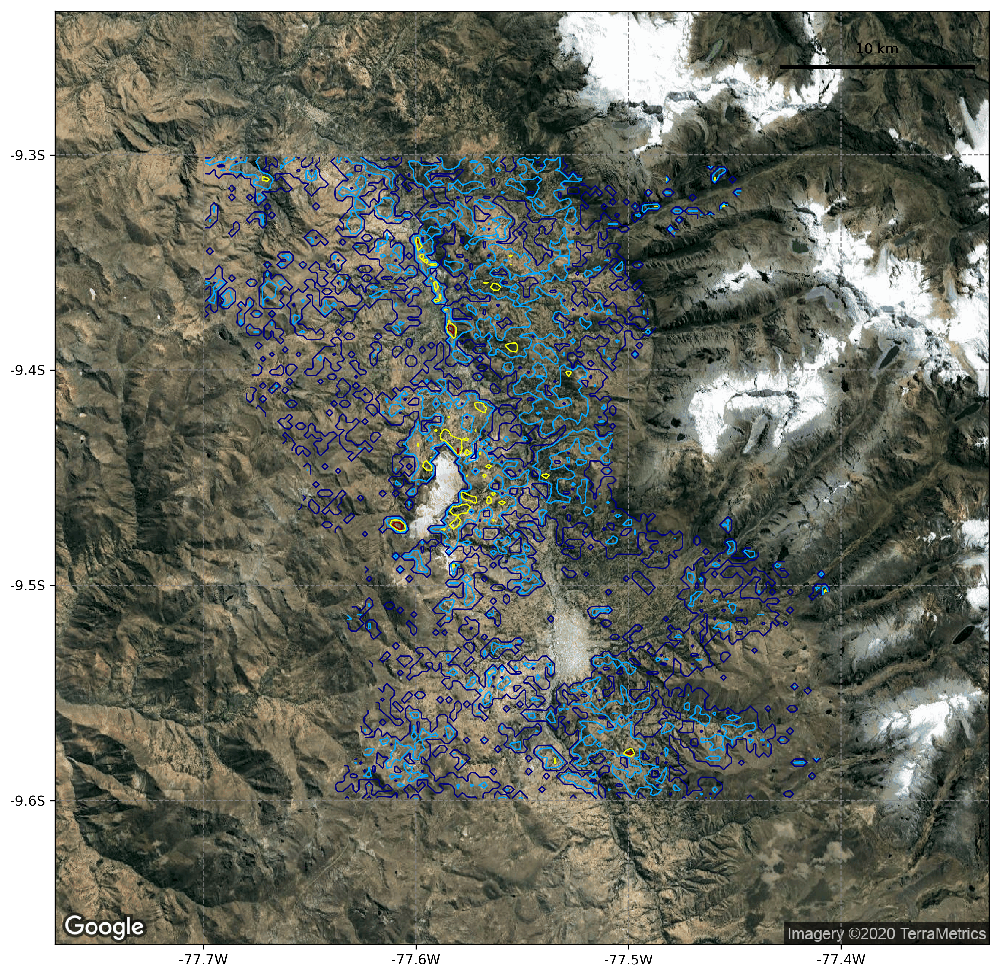

In [337]:
f = plt.figure(figsize=(20,10), dpi=300)
ax = f.add_subplot(111)

sm.set_rgb(ggl_img)  # add the background rgb image
sm.set_scale_bar(location=(0.88, 0.94))  # add scale

xx, yy = sm.grid.transform(pick.longitude, pick.latitude,
                             crs=pick.salem.grid.proj)
ax.contour(xx,yy, pick.isel(id=3)*10, levels=[0.01,0.05,0.1,0.15], linewidths=1, cmap='jet')
sm.visualize(ax=ax, addcbar=True)  # plot it
plt.tight_layout()
f.savefig('/home/ck/DIR/cornkle/figs/HUARAZ/NDVI_trends/huaraz_googlemap_april.jpg')